# Recommendations of new restaurant locations -- Neighborhood comparison between Pittsburgh and Cleveland

## Loading in Python modules

In [1]:
import pandas as pd
import numpy as np
import requests
import folium
import matplotlib.cm as cm
import matplotlib.colors as colors
import pgeocode # import geocoder
import geopy
import io
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import json
import seaborn as sns
from pandas.io.json import json_normalize
from sklearn.metrics.pairwise import euclidean_distances


## Loading Pittsburgh data

In [164]:
pitt_geo = r'./data/zillow-pitt-neighborhoods_m.geojson.json' 
with open('./data/zillow-pitt-neighborhoods_m.geojson.json') as f:
    pitt_data = json.load(f)


In [3]:
df_pitt_census=pd.read_excel('./data/pitt_neighborhood_census_cor.xlsx')


In [4]:
df_pitt_census.head(10)

,Neighborhood,Total Population,Income,White alone,Black alone,Asian alone,Other races,Under age 18,Age 18-64,Age 65 and over,With a High School diploma or less,With a Bachelor’s degree or higher
0,Allegheny Center,1478,40794.4766,0.556,0.271,0.042,0.132,0.099,0.725,0.175,0.558,0.442
1,Allegheny West,566,43741.6220,0.843,0.095,0.000,0.062,0.175,0.719,0.106,0.191,0.809
2,Allentown,2372,39932.4078,0.421,0.485,0.019,0.075,0.291,0.634,0.075,0.875,0.125
3,Arlington,1892,47633.4860,0.744,0.198,0.000,0.059,0.171,0.714,0.115,0.904,0.096
4,Arlington Heights,307,54102.1406,0.000,1.000,0.000,0.000,0.332,0.649,0.020,0.893,0.106
5,Banksville,3840,81782.5002,0.807,0.039,0.115,0.038,0.080,0.725,0.195,0.589,0.411
6,Bedford Dwellings,1292,22720.3254,0.020,0.971,0.000,0.009,0.256,0.554,0.190,0.961,0.040
7,Beechview,7876,51485.5944,0.795,0.139,0.014,0.052,0.188,0.650,0.163,0.713,0.288
8,Beltzhoover,1185,32888.3432,0.120,0.585,0.000,0.296,0.220,0.597,0.183,0.818,0.181
9,Bloomfield,9033,48153.4474,0.849,0.060,0.057,0.035,0.086,0.818,0.096,0.428,0.573


In [5]:
pitt_map = folium.Map(location=[40.4406, -79.9959], zoom_start=12)

pitt_map.choropleth(
    geo_data=pitt_geo,
    data=df_pitt_census,
    columns=['Neighborhood','Income'],
    key_on='feature.properties.name',
    fill_color='YlOrRd',
    fill_opacity=0.7, 
    line_opacity=1.0,
)
#    line_color='black',
for i in range(len(pitt_data['features'])):
    folium.CircleMarker(
        pitt_data['features'][i]['properties']['geo_point_2d'],
        radius=2,
        popup=pitt_data['features'][i]['properties']['name'],
        color='darkblue',#rainbow[cluster-1],
        fill=True,
        fill_color='darkblue',#rainbow[cluster-1],
        fill_opacity=0.7).add_to(pitt_map)

pitt_map



/anaconda3/lib/python3.7/site-packages/folium/folium.py:415: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  FutureWarning


## Loading Cleveland data

In [165]:
clev_geo = r'./data/zillow-clev-neighborhoods.geojson.json' 
with open('./data/zillow-clev-neighborhoods.geojson.json') as f:
    clev_data = json.load(f)


In [7]:
df_clev_census=pd.read_excel('./data/cleveland_neighborhood_census_cor.xlsx')

In [8]:
df_clev_census.head()

,Neighborhood,Total Population,Income,White alone,Black alone,Asian alone,Other races,Under age 18,Age 18-64,Age 65 and over,With a High School diploma or less,With a Bachelor’s degree or higher
0,Puritas-Longmead,14015.184009,34589.4270,0.638,0.240,0.031,0.263,0.226,0.650,0.124,0.654,0.076
1,North Broadway,8416.700000,24979.4850,0.445,0.511,0.001,0.102,0.291,0.624,0.085,0.647,0.090
2,South Broadway,12625.100000,24979.4850,0.445,0.511,0.001,0.102,0.291,0.624,0.085,0.647,0.090
3,Brooklyn Centre,9057.385084,26302.1779,0.602,0.217,0.014,0.483,0.278,0.641,0.081,0.651,0.086
4,Buckeye Shaker,11638.896943,25594.6910,0.147,0.781,0.038,0.060,0.201,0.633,0.166,0.431,0.277


In [9]:
clev_map = folium.Map(location=[41.4993, -81.6944], zoom_start=11)

clev_map.choropleth(
    geo_data=clev_geo,
    data=df_clev_census,
    columns=['Neighborhood','Income'],
    key_on='feature.properties.name',
    fill_color='YlOrRd',    
    line_color='black',
    fill_opacity=0.7, 
    line_opacity=1.0,
)

for i in range(len(clev_data['features'])):
    folium.CircleMarker(
        clev_data['features'][i]['properties']['geo_point_2d'],
        radius=2,
        popup=clev_data['features'][i]['properties']['name'],
        color='darkblue',#rainbow[cluster-1],
        fill=True,
        fill_color='darkblue',#rainbow[cluster-1],
        fill_opacity=0.7).add_to(clev_map)

clev_map

/anaconda3/lib/python3.7/site-packages/folium/folium.py:415: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  FutureWarning


## Normalize the population and income columns

In [10]:
pop_max=max(df_clev_census['Total Population'].max(),df_pitt_census['Total Population'].max())
pop_min=min(df_clev_census['Total Population'].min(),df_pitt_census['Total Population'].min())
print(pop_max,pop_min)

df_clev_census['Total Population']=(df_clev_census['Total Population']-pop_min)/(pop_max-pop_min)
df_pitt_census['Total Population']=(df_pitt_census['Total Population']-pop_min)/(pop_max-pop_min)

33334.79063579378 11


In [11]:
income_max=max(df_clev_census['Income'].max(),df_pitt_census['Income'].max())
income_min=min(df_clev_census['Income'].min(),df_pitt_census['Income'].min())
print(pop_max,pop_min)

df_clev_census['Income']=(df_clev_census['Income']-income_min)/(income_max-income_min)
df_pitt_census['Income']=(df_pitt_census['Income']-income_min)/(income_max-income_min)

33334.79063579378 11


In [12]:
clev_city=['Cleveland' for i in range(len(df_clev_census))]
pitt_city=['Pittsburgh' for i in range(len(df_pitt_census))]

df_clev_census['City']=clev_city
df_pitt_census['City']=pitt_city

## Combining two data

In [13]:
df_census=pd.concat([df_pitt_census, df_clev_census])

## Showing overall correlation of data features
There ae several highly correlated features:
- Higher white population is mildly correlated with higher income
- Higher black population is mildly anti-correlated with higher income
- The areas with higher black population tend to have higher fraction of youth (< age 18) 
- The areas with higher black population tend to have lower fraction of people in the age of 18- 64.
- Areas with higher popluation of higher education background tend to be with higher white population.

In [248]:
def highlight_max(s):
    #print(s)
    t=[]
    for v in s:
        #print(v)
        if v > 0.5:
            if(v == 1.0):
                t.append('background-color: lightgrey')
            else:
                t.append('background-color: lightgreen')
        elif v < -0.5:
            t.append('background-color: darkorange')
        else:
            t.append('')
    return t
    
df_census.drop(columns=['label']).corr().style.apply(highlight_max)

,Total Population,Income,White alone,Black alone,Asian alone,Other races,Under age 18,Age 18-64,Age 65 and over,With a High School diploma or less,With a Bachelor’s degree or higher
Total Population,1.000000,-0.209074,-0.047670,0.013231,0.147331,0.302836,0.052876,-0.008710,-0.063567,-0.291238,-0.107122
Income,-0.209074,1.000000,0.537345,-0.501953,0.099910,-0.289178,-0.305952,0.186081,0.139187,-0.161469,0.471923
White alone,-0.047670,0.537345,1.000000,-0.982444,0.149254,0.029993,-0.511166,0.566791,-0.200541,-0.342304,0.571180
Black alone,0.013231,-0.501953,-0.982444,1.000000,-0.283200,-0.119214,0.536361,-0.591635,0.205255,0.372726,-0.594224
Asian alone,0.147331,0.099910,0.149254,-0.283200,1.000000,-0.059284,-0.416683,0.379415,-0.023583,-0.436114,0.482815
Other races,0.302836,-0.289178,0.029993,-0.119214,-0.059284,1.000000,0.218323,-0.065066,-0.213277,0.045111,-0.278447
Under age 18,0.052876,-0.305952,-0.511166,0.536361,-0.416683,0.218323,1.000000,-0.808181,-0.115493,0.502437,-0.694050
Age 18-64,-0.008710,0.186081,0.566791,-0.591635,0.379415,-0.065066,-0.808181,1.000000,-0.491625,-0.523744,0.622944
Age 65 and over,-0.063567,0.139187,-0.200541,0.205255,-0.023583,-0.213277,-0.115493,-0.491625,1.000000,0.141458,-0.025189
With a High School diploma or less,-0.291238,-0.161469,-0.342304,0.372726,-0.436114,0.045111,0.502437,-0.523744,0.141458,1.000000,-0.793757


/anaconda3/lib/python3.7/site-packages/matplotlib/tight_layout.py:198: UserWarning: tight_layout cannot make axes width small enough to accommodate all axes decorations
  warnings.warn('tight_layout cannot make axes width small enough '
/anaconda3/lib/python3.7/site-packages/matplotlib/tight_layout.py:209: UserWarning: tight_layout cannot make axes height small enough to accommodate all axes decorations
  warnings.warn('tight_layout cannot make axes height small enough '


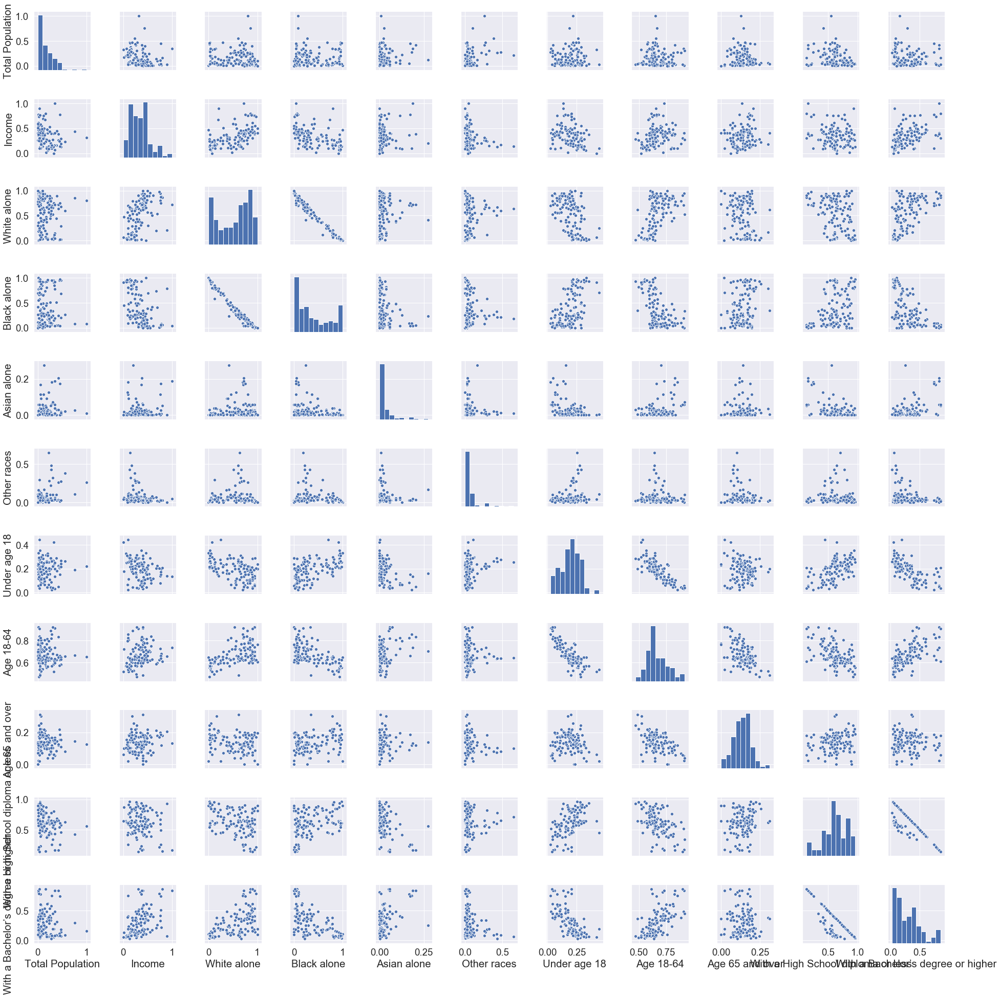

In [265]:
sns.set(font_scale=1.7)
sns.pairplot(df_census.drop(columns=['label']), height=2.5)

## Showing the mean value of each column between two cities

It is not hard to find that there are several significant differences between these two cities:
- The median population of Cleveland is much higher than pittsburgh
- Pittsburgh has higher income 
- Pittsurgh has higher white population
- Cleveland has higher African American population
- There are higher fraction of poeple in Pittsburgh with higher education background

In [233]:
df_census.groupby('City').mean()

,Total Population,Income,White alone,Black alone,Asian alone,Other races,Under age 18,Age 18-64,Age 65 and over,With a High School diploma or less,With a Bachelor’s degree or higher,label
City,,,,,,,,,,,,
Cleveland,0.320621,0.179117,0.352758,0.566761,0.021716,0.153336,0.241205,0.640136,0.118630,0.562139,0.149861,0.611111
Pittsburgh,0.104996,0.409308,0.608801,0.316932,0.030176,0.044222,0.176717,0.679624,0.143682,0.642523,0.357409,0.943182


In [57]:
df_census

,Neighborhood,Total Population,Income,White alone,Black alone,Asian alone,Other races,Under age 18,Age 18-64,Age 65 and over,With a High School diploma or less,With a Bachelor’s degree or higher,City,label,Latitude,Longitude
0,Allegheny Center,0.044023,0.322979,0.556,0.271,0.042,0.132,0.099,0.725,0.175,0.558,0.442,Pittsburgh,2,40.452655,-80.007152
1,Allegheny West,0.016655,0.354125,0.843,0.095,0.000,0.062,0.175,0.719,0.106,0.191,0.809,Pittsburgh,0,40.450924,-80.014853
2,Allentown,0.070850,0.313869,0.421,0.485,0.019,0.075,0.291,0.634,0.075,0.875,0.125,Pittsburgh,2,40.423043,-79.993886
3,Arlington,0.056446,0.395254,0.744,0.198,0.000,0.059,0.171,0.714,0.115,0.904,0.096,Pittsburgh,2,40.414532,-79.967566
4,Arlington Heights,0.008883,0.463615,0.000,1.000,0.000,0.000,0.332,0.649,0.020,0.893,0.106,Pittsburgh,1,40.416695,-79.961502
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31,Tremont,0.231306,0.248044,0.722,0.188,0.007,0.281,0.204,0.735,0.061,0.446,0.334,Cleveland,2,41.473855,-81.686506
32,Corlett,0.286054,0.156888,0.028,0.950,0.002,0.029,0.263,0.571,0.166,0.606,0.079,Cleveland,1,41.448265,-81.589091
33,Union Miles Park,0.286054,0.156888,0.028,0.950,0.002,0.029,0.263,0.571,0.166,0.606,0.079,Cleveland,1,41.454559,-81.615046
34,University District,0.224205,0.090775,0.568,0.260,0.126,0.000,0.066,0.797,0.137,0.414,0.391,Cleveland,2,41.505760,-81.605502


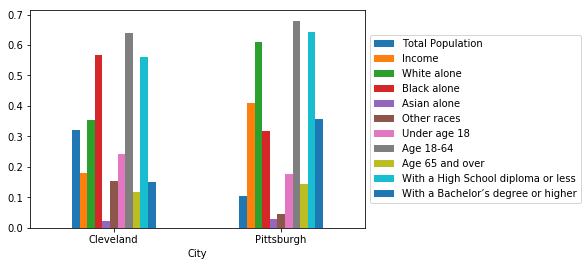

In [59]:
df_census.drop(columns=['Longitude','Latitude','label']).groupby('City').mean().plot(rot=0,kind='bar')
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
plt.show()

## Running K-means clustering on Pittsburh-Cleveland Census data
Set the number of clusters to be 3

In [17]:
kmean_data=df_census.values[:,1:-2]

In [26]:
num_clusters = 3

k_means = KMeans(init="k-means++", n_clusters=num_clusters, n_init=12)
k_means.fit(kmean_data)
labels = k_means.labels_

#print(labels)
df_census['label']=labels?
df_pitt_label=df_census.iloc[0:88,:]
df_clev_label=df_census.iloc[88:,:]

In [27]:
df_census['label']=labels

In [24]:
df_census['label']=labels

### Showing the number of neighborhood of each cluster

In [231]:
df_census[['label','Neighborhood']].groupby('label').count()

,Neighborhood
label,
0,52
1,39
2,33


### Showing the mean values of features for each cluster
There are several distinct features of each cluster:
- Cluster 0: Higher white population, higher income, and higher education background
- Cluster 1: Higher black population, lower income, and lower education background
- Cluster 2: In between cluster 0 and 1, but with higher other race population than the other two.

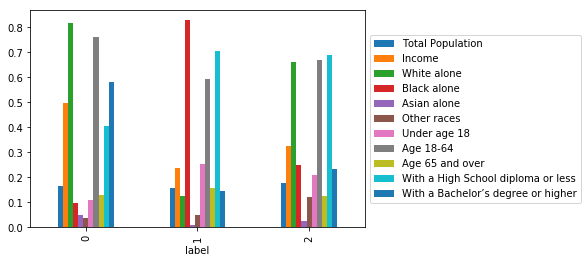

In [220]:
df_census.groupby('label').mean().plot(kind='bar')
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
plt.show()

## Showing the spatial distribution of different clusters in Cleveland and Pittsburgh
- Cluster 0: yellow
- Cluster 1: white
- Cluster 2: purple

In [28]:
from branca.colormap import LinearColormap
clev_map = folium.Map(location=[41.4993, -81.6944], zoom_start=11)
import branca.colormap as cm


clev_map.choropleth(
    geo_data=clev_geo,
    data=df_clev_label,
    columns=['Neighborhood','label'],
    key_on='feature.properties.name',  
    fill_color='PuOr',
    threshold_scale = [0,1,2,3],
    line_color='black',
    fill_opacity=0.7, 
    line_opacity=1.0,
)

for i in range(len(clev_data['features'])):
    folium.CircleMarker(
        clev_data['features'][i]['properties']['geo_point_2d'],
        radius=2,
        popup=clev_data['features'][i]['properties']['name'],
        color='darkblue',#rainbow[cluster-1],
        fill=True,
        fill_color='darkblue',#rainbow[cluster-1],
        fill_opacity=0.7).add_to(clev_map)
    

clev_map

/anaconda3/lib/python3.7/site-packages/folium/folium.py:415: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  FutureWarning


In [250]:
pitt_map = folium.Map(location=[40.4406, -79.9959], zoom_start=12)

pitt_map.choropleth(
    geo_data=pitt_geo,
    data=df_pitt_label,
    columns=['Neighborhood','label'],
    key_on='feature.properties.name',
    fill_color='PuOr',
    threshold_scale = [0,1,2,3],
    fill_opacity=0.7, 
    line_opacity=1.0,
)
#    line_color='black',
for i in range(len(pitt_data['features'])):
    folium.CircleMarker(
        pitt_data['features'][i]['properties']['geo_point_2d'],
        radius=2,
        popup=pitt_data['features'][i]['properties']['name'],
        color='darkblue',#rainbow[cluster-1],
        fill=True,
        fill_color='darkblue',#rainbow[cluster-1],
        fill_opacity=0.7).add_to(pitt_map)

pitt_map

/anaconda3/lib/python3.7/site-packages/folium/folium.py:415: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  FutureWarning


## Loading in the coordiante (geomatric center of the neighborhood) of each neighborhood from the json files

In [29]:
pitt_neigh_name_json=[pitt_data['features'][i]['properties']['name'] for i in range(len(pitt_data['features']))]
clev_neigh_name_json=[clev_data['features'][i]['properties']['name'] for i in range(len(clev_data['features']))]

In [30]:
pitt_lat=[]
pitt_lon=[]
for i in df_pitt_label['Neighborhood']:
    ind=pitt_neigh_name_json.index(i)
    coor=pitt_data['features'][ind]['properties']['geo_point_2d']
    pitt_lat.append(coor[0])
    pitt_lon.append(coor[1])
    
clev_lat=[]
clev_lon=[]
for i in df_clev_label['Neighborhood']:
    ind=clev_neigh_name_json.index(i)
    coor=clev_data['features'][ind]['properties']['geo_point_2d']
    clev_lat.append(coor[0])
    clev_lon.append(coor[1])    
lat=pitt_lat+clev_lat
lon=pitt_lon+clev_lon
df_census['Latitude']=lat
df_census['Longitude']=lon

In [21]:
df_census.tail()

,Neighborhood,Total Population,Income,White alone,Black alone,Asian alone,Other races,Under age 18,Age 18-64,Age 65 and over,With a High School diploma or less,With a Bachelor’s degree or higher,City,label,Latitude,Longitude
31,Tremont,0.231306,0.248044,0.722,0.188,0.007,0.281,0.204,0.735,0.061,0.446,0.334,Cleveland,2,41.473855,-81.686506
32,Corlett,0.286054,0.156888,0.028,0.950,0.002,0.029,0.263,0.571,0.166,0.606,0.079,Cleveland,0,41.448265,-81.589091
33,Union Miles Park,0.286054,0.156888,0.028,0.950,0.002,0.029,0.263,0.571,0.166,0.606,0.079,Cleveland,0,41.454559,-81.615046
34,University District,0.224205,0.090775,0.568,0.260,0.126,0.000,0.066,0.797,0.137,0.414,0.391,Cleveland,2,41.505760,-81.605502
35,West Boulevard,0.556794,0.234380,0.601,0.267,0.022,0.383,0.264,0.657,0.079,0.628,0.091,Cleveland,2,41.459127,-81.755009


## Explore the venues of neighborhoods in Pittsburgh and Cleveland

### Now, let's get the information of venues here by setting up the Foursquare credentials and version first .

In [22]:
CLIENT_ID = 'XXXXXX' # your Foursquare ID, not showing here
CLIENT_SECRET = 'XXXXXX' # your Foursquare Secret, not showing here
VERSION = '20200520' # Foursquare API version

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: JOD3UAS5TU33D5EHAGUQJVEUR1IONS4235NZYQOUXPMDQGYI
CLIENT_SECRET:ISQUTZECLINMSRTMH1NFRYJBOL0X4PUG5KPH2EMRURJE2BOA


In [1594]:
def getNearbyVenues(names, latitudes, longitudes, radius=600,LIMIT=300):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):        
        #print(name,lat,lng)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        #print(results)
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])
    
    print(name,len(results))

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    #print(nearby_venues,len(nearby_venues))
    if(len(nearby_venues) > 0):
        nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

# Check if those venues are ACTUALLY within the neighborhood

### Getting the information of Pittsburgh venues

In [1549]:
pitt_neigh=sorted(list(set(df_pitt_census['Neighborhood'].values)))
pitt_neigh_json=[pitt_data['features'][i]['properties']['name'] for i in range(len(pitt_data['features']))]

In [1566]:
for i2,pitt_neigh_ind in enumerate(pitt_neigh[75:]):
    
    j=pitt_neigh_json.index(pitt_neigh_ind)
    ng = len(pitt_data['features'][j]['geometry']['coordinates'][0])
    print(pitt_data['features'][j]['properties']['name'])
    neigh_json_lat=[pitt_data['features'][j]['geometry']['coordinates'][0][i][0] for i in range(ng)] 
    neigh_json_lon=[pitt_data['features'][j]['geometry']['coordinates'][0][i][1] for i in range(ng)] 
    lon_c=pitt_data['features'][j]['properties']['geo_point_2d'][1]
    lat_c=pitt_data['features'][j]['properties']['geo_point_2d'][0]

    n_geo=len(pitt_data['features'][j]['geometry']['coordinates'][0])
    if(n_geo > 30):
        n_geo_step=25#int(n_geo//5)
    else:
        n_geo_step=5
    lat_border=[pitt_data['features'][j]['geometry']['coordinates'][0][i][1] for i in range(0,n_geo,n_geo_step)]
    lon_border=[pitt_data['features'][j]['geometry']['coordinates'][0][i][0] for i in range(0,n_geo,n_geo_step)]
    
    if(n_geo > 1):
        neigh_coor_lon=[(lon_c+lon_border[j2])/2.0 for j2 in range(0,len(lon_border))]
        neigh_coor_lat=[(lat_c+lat_border[j2])/2.0 for j2 in range(0,len(lat_border))]
        neigh_coor_lon=neigh_coor_lon+[lon_c]#+lon_border
        neigh_coor_lat=neigh_coor_lat+[lat_c]#+lat_border
    else:
        neigh_coor_lon=[lon_c]
        neigh_coor_lat=[lat_c]
    #print(len(neigh_coor_lon))

    neigh_names=[pitt_data['features'][j]['properties']['name'] for i in range(len(neigh_coor_lon))]
    
    #==== Searching for venue data ====
    neigh_venues = getNearbyVenues(names=neigh_names,
                                   latitudes=neigh_coor_lat,
                                   longitudes=neigh_coor_lon,LIMIT=200)
    if(len(neigh_venues) > 0):
        #==== Removing duplicates ======
        neigh_venues.drop(columns=['Neighborhood Latitude','Neighborhood Longitude'],inplace=True)
        neigh_venues.drop_duplicates(ignore_index=True,inplace=True)#.reset_index(inplace=True)
    
        #==== Finding those lying within the neighborhood ====
        ct=0
        df_t=neigh_venues#pitt_clev_venues[pitt_clev_venues['Neighborhood']==pitt_neigh[j]]
        drop_ind=[]
        for i in range(len(df_t)):
            point = Point(df_t.iloc[i,3],df_t.iloc[i,2])
            ind=j#pitt_neigh_json.index(pitt_neigh[j])
            polygon = shape( pitt_data['features'][ind]['geometry'])

            if polygon.contains(point):
                ct+=1
                #print (df_t['Venue'][i],' #',i,' found in neighborhood:', pitt_data['features'][ind]['properties']['name'])
            else:
                drop_ind.append(i)

        print(ct,' venues')
        print(' ')
        neigh_venues.drop(drop_ind,inplace = True)
        neigh_venues.reset_index(inplace = True)
        neigh_venues.drop(columns=['index'],inplace=True)
    
        if(i2 < 0):
            pitt_neigh_venues = neigh_venues
            pitt_neigh_coor_lon = neigh_coor_lon
            pitt_neigh_coor_lat = neigh_coor_lat
        else:
            pitt_neigh_venues=pd.concat([pitt_neigh_venues,neigh_venues])
            pitt_neigh_coor_lon = pitt_neigh_coor_lon+neigh_coor_lon
            pitt_neigh_coor_lat = pitt_neigh_coor_lat+neigh_coor_lat
        


St. Clair
St. Clair 0
Stanton Heights
Stanton Heights 5
9  venues
 
Strip District
Strip District 67
92  venues
 
Summer Hill
Summer Hill 3
5  venues
 
Swisshelm Park
Swisshelm Park 4
5  venues
 
Terrace Village
Terrace Village 8
7  venues
 
Troy Hill
Troy Hill 9
11  venues
 
Upper Hill
Upper Hill 6
2  venues
 
Upper Lawrenceville
Upper Lawrenceville 20
35  venues
 
West End
West End 12
13  venues
 
West Oakland
West Oakland 18
8  venues
 
Westwood
Westwood 8
17  venues
 
Wind Gap
Wind Gap 2
6  venues
 


In [1569]:
pitt_neigh_venues.reset_index(inplace = True)
pitt_neigh_venues.drop(columns=['index'],inplace = True)

In [34]:
pitt_neigh_venues.drop(columns=['Unnamed: 0'],inplace = True)
pitt_neigh_venues

,Neighborhood,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Allegheny Center,Children's Museum of Pittsburgh,40.452793,-80.006569,Museum
1,Allegheny Center,Federal Galley,40.451605,-80.006045,Food Court
2,Allegheny Center,National Aviary,40.453154,-80.010049,Zoo
3,Allegheny Center,New Hazlett Theater,40.453081,-80.004844,Performing Arts Venue
4,Allegheny Center,Penguin Connection,40.453179,-80.010128,Exhibit
...,...,...,...,...,...
2006,Wind Gap,Chartiers Field,40.456692,-80.074541,Baseball Field
2007,Wind Gap,Dykema Rubber Band Co,40.463419,-80.078689,Paper / Office Supplies Store
2008,Wind Gap,Wind Gap Ave.,40.449466,-80.069980,Travel & Transport
2009,Wind Gap,Dillons Trap,40.458986,-80.073406,Candy Store


In [32]:
pitt_neigh_venues=pd.read_excel("./data/pitt_neigh_venues.xlsx")

In [1574]:
#pitt_neigh_venues.to_excel("./data/pitt_neigh_venues.xlsx")  

In [253]:
pitt_map = folium.Map(location=[40.452655,-80.007152], zoom_start=13)
#colormap = cm.linear.YlGnBu_09.to_step(15)

pitt_map.choropleth(
    geo_data=pitt_geo,
    data=cluster_data,#df_clev_label_m,
    columns=['Neighborhood','label'],
    key_on='feature.properties.name',  
    fill_color='PuOr',
    #threshold_scale = [0,1,2,3,4,5,6],
    nan_fill_color='White',
    line_color='black',
    nan_fill_opacity=0.0,
    fill_opacity=0.7, 
    line_opacity=1.0,
)

for i in range(len(pitt_neigh_venues)):
    folium.CircleMarker(
        [pitt_neigh_venues.iloc[i,2],pitt_neigh_venues.iloc[i,3]],
        radius=0.5,
        popup=pitt_neigh_venues['Venue'][i],
        color='red',#rainbow[cluster-1],
        fill=True,
        fill_color='red',#rainbow[cluster-1],
        fill_opacity=0.7).add_to(pitt_map)

#for lon_t,lat_t in zip(pitt_neigh_coor_lon,pitt_neigh_coor_lat):
#    folium.CircleMarker(
#        [lat_t,lon_t],
#        radius=1,
#        color='cyan',#rainbow[cluster-1],
#        fill=True,
#        fill_color='cyan',#rainbow[cluster-1],
#        fill_opacity=0.7).add_to(pitt_map)


for i in range(len(pitt_data['features'])):
    folium.CircleMarker(
        pitt_data['features'][i]['properties']['geo_point_2d'],
        radius=2,
        popup=pitt_data['features'][i]['properties']['name'],
        color='darkblue',#rainbow[cluster-1],
        fill=True,
        fill_color='darkblue',#rainbow[cluster-1],
        fill_opacity=0.7).add_to(pitt_map)

pitt_map


/anaconda3/lib/python3.7/site-packages/folium/folium.py:415: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  FutureWarning


### Getting the information of Cleveland venues

In [1575]:
clev_neigh=sorted(list(set(df_clev_census['Neighborhood'].values)))
clev_neigh_json=[clev_data['features'][i]['properties']['name'] for i in range(len(clev_data['features']))]

In [1601]:
for i2,clev_neigh_ind in enumerate(clev_neigh[0:]):
    
    j=clev_neigh_json.index(clev_neigh_ind)
    ng = len(clev_data['features'][j]['geometry']['coordinates'][0])
    print(clev_data['features'][j]['properties']['name'])
    neigh_json_lat=[clev_data['features'][j]['geometry']['coordinates'][0][i][0] for i in range(ng)] 
    neigh_json_lon=[clev_data['features'][j]['geometry']['coordinates'][0][i][1] for i in range(ng)] 

    lon_c=clev_data['features'][j]['properties']['geo_point_2d'][1]
    lat_c=clev_data['features'][j]['properties']['geo_point_2d'][0]

    n_geo=len(clev_data['features'][j]['geometry']['coordinates'][0])
    if(n_geo > 30):
        n_geo_step=25#int(n_geo//5)
    else:
        n_geo_step=5
    lat_border=[clev_data['features'][j]['geometry']['coordinates'][0][i][1] for i in range(0,n_geo,n_geo_step)]
    lon_border=[clev_data['features'][j]['geometry']['coordinates'][0][i][0] for i in range(0,n_geo,n_geo_step)]
    
    if(n_geo > 1):
        neigh_coor_lon=[(lon_c+lon_border[j2])/2.0 for j2 in range(0,len(lon_border))]
        neigh_coor_lat=[(lat_c+lat_border[j2])/2.0 for j2 in range(0,len(lat_border))]
        neigh_coor_lon=neigh_coor_lon+[lon_c]+lon_border
        neigh_coor_lat=neigh_coor_lat+[lat_c]+lat_border
    else:
        neigh_coor_lon=[lon_c]
        neigh_coor_lat=[lat_c]
    #print(len(neigh_coor_lon))

    neigh_names=[clev_data['features'][j]['properties']['name'] for i in range(len(neigh_coor_lon))]
    
    #==== Searching for venue data ====
    neigh_venues = getNearbyVenues(names=neigh_names,
                                   latitudes=neigh_coor_lat,
                                   longitudes=neigh_coor_lon,LIMIT=200)
    if(len(neigh_venues) > 0):
        #==== Removing duplicates ======
        neigh_venues.drop(columns=['Neighborhood Latitude','Neighborhood Longitude'],inplace=True)
        neigh_venues.drop_duplicates(ignore_index=True,inplace=True)#.reset_index(inplace=True)
    
        #==== Finding those lying within the neighborhood ====
        ct=0
        df_t=neigh_venues#pitt_clev_venues[pitt_clev_venues['Neighborhood']==pitt_neigh[j]]
        drop_ind=[]
        for i in range(len(df_t)):
            point = Point(df_t.iloc[i,3],df_t.iloc[i,2])
            ind=j#pitt_neigh_json.index(pitt_neigh[j])
            polygon = shape(clev_data['features'][ind]['geometry'])

            if polygon.contains(point):
                ct+=1
                #print (df_t['Venue'][i],' #',i,' found in neighborhood:', pitt_data['features'][ind]['properties']['name'])
            else:
                drop_ind.append(i)

        print(ct,' venues')
        print(' ')
        neigh_venues.drop(drop_ind,inplace = True)
        neigh_venues.reset_index(inplace = True)
        neigh_venues.drop(columns=['index'],inplace=True)
    
        if(i2 == 0):
            clev_neigh_venues = neigh_venues
            clev_neigh_coor_lon = neigh_coor_lon
            clev_neigh_coor_lat = neigh_coor_lat
        else:
            clev_neigh_venues=pd.concat([clev_neigh_venues,neigh_venues])
            clev_neigh_coor_lon = clev_neigh_coor_lon+neigh_coor_lon
            clev_neigh_coor_lat = clev_neigh_coor_lat+neigh_coor_lat
        


Brooklyn Centre
Brooklyn Centre 13
33  venues
 
Buckeye Shaker
Buckeye Shaker 0
40  venues
 
Central
Central 6
53  venues
 
Clark Fulton
Clark Fulton 32
29  venues
 
Corlett
Corlett 8
20  venues
 
Cudell
Cudell 7
46  venues
 
Detroit Shoreway
Detroit Shoreway 6
99  venues
 
Downtown
Downtown 0
332  venues
 
Edgewater
Edgewater 15
48  venues
 
Euclid Green
Euclid Green 1
14  venues
 
Fairfax
Fairfax 24
35  venues
 
Forest Hills
Forest Hills 4
23  venues
 
Glenville
Glenville 4
33  venues
 
Goodrich-Kirkland Park
Goodrich-Kirkland Park 6
69  venues
 
Hough
Hough 4
28  venues
 
Industrial Valley
Industrial Valley 25
8  venues
 
Jefferson
Jefferson 22
42  venues
 
Kamm's Corner
Kamm's Corner 11
107  venues
 
Kinsman
Kinsman 4
18  venues
 
Lee Miles
Lee Miles 2
26  venues
 
Mt Pleasant
Mt Pleasant 2
27  venues
 
North Broadway
North Broadway 4
20  venues
 
North Collinwood
North Collinwood 16
67  venues
 
Ohio City - West Side
Ohio City - West Side 18
147  venues
 
Old Brooklyn
Old Brooklyn

In [1602]:
clev_neigh_venues.reset_index(inplace = True)
clev_neigh_venues.drop(columns=['index'],inplace = True)

In [39]:
clev_neigh_venues=pd.read_excel("./data/clev_neigh_venues.xlsx")

In [1605]:
#clev_neigh_venues.to_excel("./data/clev_neigh_venues.xlsx")  

In [42]:
clev_neigh_venues.drop(columns=['Unnamed: 0'],inplace = True)
clev_neigh_venues

,Neighborhood,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Brooklyn Centre,Towers Café,41.460405,-81.697907,Café
1,Brooklyn Centre,Gino's,41.451855,-81.689583,Bar
2,Brooklyn Centre,ALDI,41.455859,-81.689795,Grocery Store
3,Brooklyn Centre,Denison Ball Fields,41.452081,-81.692436,Baseball Field
4,Brooklyn Centre,RTA MetroHealth Line - Pearl/Archwood (Brookly...,41.453563,-81.688608,Bus Line
...,...,...,...,...,...
2109,Woodland Hills,City Blue,41.480295,-81.603294,Clothing Store
2110,Woodland Hills,Buckeye Fast Food (Webbs II BBQ),41.480295,-81.603294,BBQ Joint
2111,Woodland Hills,McDonald's,41.480920,-81.604748,Fast Food Restaurant
2112,Woodland Hills,Family Dollar,41.468581,-81.603487,Discount Store


In [255]:
clev_map = folium.Map(location=[41.4993,-81.6944], zoom_start=12)
#colormap = cm.linear.YlGnBu_09.to_step(15)

clev_map.choropleth(
    geo_data=clev_geo,
    data=cluster_data,#df_clev_label_m,
    columns=['Neighborhood','label'],
    key_on='feature.properties.name',  
    fill_color='PuOr',
    #threshold_scale = [0,1,2,3,4,5,6],
    nan_fill_color='White',
    line_color='black',
    nan_fill_opacity=0.0,
    fill_opacity=0.7, 
    line_opacity=1.0,
)

for i in range(len(clev_neigh_venues)):
    folium.CircleMarker(
        [clev_neigh_venues.iloc[i,2],clev_neigh_venues.iloc[i,3]],
        radius=0.5,
        popup=clev_neigh_venues['Venue'][i],
        color='red',#rainbow[cluster-1],
        fill=True,
        fill_color='red',#rainbow[cluster-1],
        fill_opacity=0.7).add_to(clev_map)

#for lon_t,lat_t in zip(clev_neigh_coor_lon,clev_neigh_coor_lat):
#    folium.CircleMarker(
#        [lat_t,lon_t],
#        radius=1,
#        color='cyan',#rainbow[cluster-1],
#        fill=True,
#        fill_color='cyan',#rainbow[cluster-1],
#        fill_opacity=0.7).add_to(clev_map)


for i in range(len(clev_data['features'])):
    folium.CircleMarker(
        clev_data['features'][i]['properties']['geo_point_2d'],
        radius=2,
        popup=clev_data['features'][i]['properties']['name'],
        color='darkblue',#rainbow[cluster-1],
        fill=True,
        fill_color='darkblue',#rainbow[cluster-1],
        fill_opacity=0.7).add_to(clev_map)

clev_map

/anaconda3/lib/python3.7/site-packages/folium/folium.py:415: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  FutureWarning


### Showing the top 10 most common venues

In [44]:
pitt_clev_venues=pd.concat([pitt_neigh_venues,clev_neigh_venues])

In [1611]:
pitt_clev_venues_old=pitt_clev_venues

In [60]:
pitt_clev_venues[['Venue Category','Neighborhood']].groupby('Venue Category').count().sort_values('Neighborhood',ascending=False).head(10)

,Neighborhood
Venue Category,
Bar,176
Pizza Place,152
Coffee Shop,132
Sandwich Place,112
Park,103
American Restaurant,89
Grocery Store,72
Italian Restaurant,71
Convenience Store,69


In [49]:
venue_count=pitt_clev_venues[['Venue Category','Neighborhood']].groupby('Venue Category').count().sort_values('Neighborhood',ascending=False)#.tail(10)

### Showing the top 10 neighborhood that has the most venues within a neighborhood

In [63]:
pitt_clev_venues[['Venue Category','Neighborhood']].groupby("Neighborhood").count().sort_values('Venue Category',ascending=False).head(10)

,Venue Category
Neighborhood,
Downtown,332
Central Business District,158
Tremont,156
Southside Flats,155
Ohio City - West Side,147
Old Brooklyn,145
Squirrel Hill South,107
Kamm's Corner,107
Detroit Shoreway,99


## Next, we generate clusters using venue types in each Pittsburgh Neighborhood

### Using one hot encoding to generate different features for different venue categories

In [50]:
# one hot encoding
pitt_clev_onehot = pd.get_dummies(pitt_clev_venues[['Venue Category']], prefix="", prefix_sep="")

# move the column to head of list using index, pop and insert
pitt_clev_onehot['Neighborhood'] = pitt_clev_venues['Neighborhood'] 
cols = list(pitt_clev_onehot)
cols.insert(0, cols.pop(cols.index('Neighborhood')))
pitt_clev_onehot = pitt_clev_onehot[cols]

#pitt_clev_onehot.head()
pitt_clev_grouped = pitt_clev_onehot.groupby('Neighborhood').mean().reset_index()
print(pitt_clev_grouped.shape)
pitt_clev_grouped.head()

(121, 381)


,Neighborhood,ATM,Accessories Store,Adult Boutique,African Restaurant,Airport,Airport Food Court,Airport Lounge,Airport Service,Airport Terminal,...,Vietnamese Restaurant,Volleyball Court,Wine Bar,Wine Shop,Winery,Wings Joint,Women's Store,Yoga Studio,Zoo,Zoo Exhibit
0,Allegheny Center,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.083333,0.0
1,Allegheny West,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
2,Allentown,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
3,Arlington,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
4,Banksville,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0


## Drop the venue categories that have counts lower than 20

In [51]:
low_count_venues=venue_count[venue_count['Neighborhood'] <= 20].reset_index().iloc[:,0].values
low_count_venues=list(low_count_venues)
low_count_venues.remove('Neighborhood')
#low_count_venues=np.array(low_count_venues)

In [52]:
pitt_clev_grouped.drop(columns=low_count_venues,inplace = True)

In [54]:
pitt_clev_grouped

,Neighborhood,American Restaurant,Art Gallery,BBQ Joint,Bakery,Bank,Bar,Baseball Field,Brewery,Burger Joint,...,Pharmacy,Pizza Place,Playground,Pub,Restaurant,Sandwich Place,Seafood Restaurant,Theater,Thrift / Vintage Store,Zoo Exhibit
0,Allegheny Center,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.0,...,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0
1,Allegheny West,0.222222,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.0,...,0.000000,0.000000,0.0,0.111111,0.000000,0.222222,0.0,0.000000,0.000000,0.0
2,Allentown,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.0,...,0.000000,0.090909,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0
3,Arlington,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.500000,0.0,0.0,...,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0
4,Banksville,0.040000,0.0,0.040000,0.0,0.000000,0.000000,0.000000,0.0,0.0,...,0.040000,0.080000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.040000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
116,West End,0.000000,0.0,0.000000,0.0,0.000000,0.153846,0.000000,0.0,0.0,...,0.000000,0.076923,0.0,0.000000,0.000000,0.000000,0.0,0.153846,0.000000,0.0
117,West Oakland,0.000000,0.0,0.000000,0.0,0.125000,0.000000,0.000000,0.0,0.0,...,0.000000,0.125000,0.0,0.000000,0.125000,0.000000,0.0,0.000000,0.000000,0.0
118,Westwood,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.0,...,0.058824,0.058824,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.058824,0.0
119,Wind Gap,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.166667,0.0,0.0,...,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0


In [64]:
pitt_clev_data = pd.merge(df_census.drop(columns=['City','label','Latitude','Longitude']), pitt_clev_grouped, on='Neighborhood')

## Running K-means clustering on Pittsburh-Cleveland Census + Venue data
Set the number of clusters to be 6

In [65]:
pitt_kmean_data=pitt_clev_data.values[0:88,1:]#pitt_clev_data.values[:,1:-1]
clev_kmean_data=pitt_clev_data.values[88:,1:]#pitt_clev_data.values[:,1:-1]
kmean_data=pitt_clev_data.values[:,1:]

### Preprocess data

In [66]:
kmean_data.shape
from sklearn.preprocessing import StandardScaler

kmean_data = StandardScaler().fit_transform(kmean_data)


### Use elbow method to check the prefered cluster number

In [85]:
from sklearn import metrics 
from scipy.spatial.distance import cdist 

In [95]:
distortions = [] 
inertias = [] 
mapping1 = {} 
mapping2 = {} 
K = range(3,18) 
  
for k in K: 
    #Building and fitting the model 
    kmeanModel = KMeans(n_clusters=k, n_init=700,max_iter=1000).fit(kmean_data) 
    kmeanModel.fit(kmean_data)     
      
    distortions.append(sum(np.min(cdist(kmean_data, kmeanModel.cluster_centers_, 
                      'euclidean'),axis=1)) / kmean_data.shape[0]) 
    inertias.append(kmeanModel.inertia_) 
  
    mapping1[k] = sum(np.min(cdist(kmean_data, kmeanModel.cluster_centers_, 
                 'euclidean'),axis=1)) / kmean_data.shape[0] 
    mapping2[k] = kmeanModel.inertia_ 

In [96]:
for key,val in mapping1.items(): 
    print(str(key)+' : '+str(val))

3 : 6.818156865017576
4 : 6.681878270403613
5 : 6.578118034905455
6 : 6.48661494677894
7 : 6.415168514385551
8 : 6.341087430372214
9 : 6.166684235725671
10 : 6.136270726408709
11 : 6.036445634425507
12 : 5.988555951850913
13 : 5.8542332427184895
14 : 5.74406303969584
15 : 5.710960908823786
16 : 5.620729380339801
17 : 5.546360086715427


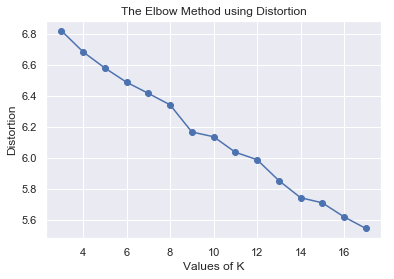

In [100]:
sns.set()
plt.plot(K, distortions, 'bo-') 
plt.xlabel('Values of K') 
plt.ylabel('Distortion') 
plt.title('The Elbow Method using Distortion') 
plt.show() 

### Run the K_means algorithm on the neighborhood data

In [110]:
num_clusters = 6

k_means = KMeans(init="k-means++", n_clusters=num_clusters, n_init=700,max_iter=1000)
k_means.fit(kmean_data)
labels = k_means.labels_
cluster_centers =k_means.cluster_centers_

#cluster_data=pitt_clev_data.iloc[:,:]
#cluster_data['label']=labels



In [111]:
# clustering counts in Pittsburgh
cluster_data[['label','Neighborhood']].iloc[0:88,:].groupby('label').count()

,Neighborhood
label,
0,9
1,1
2,13
3,18
4,46
5,1


In [112]:
# clustering counts in Cleveland
cluster_data[['label','Neighborhood']].iloc[88:,:].groupby('label').count()

,Neighborhood
label,
0,10
2,17
3,2
4,4


In [136]:
pitt_ct=cluster_data[['label','Neighborhood']].iloc[0:88,:].groupby('label').count().iloc[:,0].values
pitt_size=pitt_ct/np.sum(pitt_ct)*100

clev_ct=cluster_data[['label','Neighborhood']].iloc[88:,:].groupby('label').count().iloc[:,0].values
clev_size_t=clev_ct/np.sum(clev_ct)*100

In [137]:
print(clev_ct)
print(clev_size_t)
clev_size=np.zeros(6)
clev_size[0]=clev_size_t[0]
clev_size[1]=0
clev_size[2]=clev_size_t[1]
clev_size[3]=clev_size_t[2]
clev_size[4]=clev_size_t[3]
clev_size[5]=0

[10 17  2  4]
[30.3030303  51.51515152  6.06060606 12.12121212]


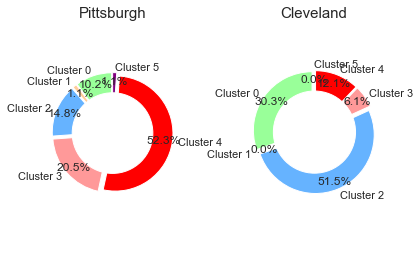

In [152]:
import matplotlib.pyplot as plt
# Pie chart
plt.subplots_adjust(hspace = 0.0,wspace=0.5)
ax1=plt.subplot(121)
labels = ['Cluster 0', 'Cluster 1', 'Cluster 2', 'Cluster 3','Cluster 4','Cluster 5']
sizes = pitt_size#[15, 30, 45, 10]
#colors
colors = ['#99ff99','#ffcc99','#66b3ff','#ff9999','red','purple']

#explsion
explode = (0.05,0.05,0.05,0.05,0.05,0.05)
 
plt.pie(sizes, colors = colors, labels=labels, autopct='%1.1f%%', startangle=90, pctdistance=0.85, explode = explode)
#draw circle
centre_circle = plt.Circle((0,0),0.70,fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
# Equal aspect ratio ensures that pie is drawn as a circle
ax1.axis('equal') 
plt.title('Pittsburgh',fontsize=15)

ax1=plt.subplot(122)
labels = ['Cluster 0', 'Cluster 1', 'Cluster 2', 'Cluster 3','Cluster 4','Cluster 5']
sizes = clev_size#[15, 30, 45, 10]
#colors
#colors = ['#ffcc99','#99ff99','#66b3ff','#ff9999','red','purple']
#explsion
explode = (0.05,0.05,0.05,0.05,0.05,0.05)
 
plt.pie(sizes, colors = colors, labels=labels, autopct='%1.1f%%', startangle=90, pctdistance=0.85, explode = explode)
#draw circle
centre_circle = plt.Circle((0,0),0.70,fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
# Equal aspect ratio ensures that pie is drawn as a circle
ax1.axis('equal') 
plt.title('Cleveland',fontsize=15)

plt.show()

In [191]:
pitt_map = folium.Map(location=[40.4406, -79.9959], zoom_start=12)
#colormap = cm.linear.YlGnBu_09.to_step(15)

pitt_map.choropleth(
    geo_data=pitt_geo,
    data=cluster_data,#df_clev_label_m,
    columns=['Neighborhood','label'],
    key_on='feature.properties.name',  
    fill_color='PuOr',
    threshold_scale = [0,1,2,3,4,5,6],
    nan_fill_color='White',
    line_color='black',
    nan_fill_opacity=0.0,
    fill_opacity=0.7, 
    line_opacity=1.0,
)

for i in range(len(pitt_data['features'])):
    folium.CircleMarker(
        pitt_data['features'][i]['properties']['geo_point_2d'],
        radius=2,
        popup=pitt_data['features'][i]['properties']['name'],
        color='darkblue',#rainbow[cluster-1],
        fill=True,
        fill_color='darkblue',#rainbow[cluster-1],
        fill_opacity=0.7).add_to(pitt_map)

pitt_map

/anaconda3/lib/python3.7/site-packages/folium/folium.py:415: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  FutureWarning


### Combining two json files

In [ ]:
with open(pitt_geo, "rb") as infile:
    pitt_result=json.load(infile)
    
with open(clev_geo, "rb") as infile:
    clev_result=json.load(infile)    

for i in range(len(clev_result['features'])):
    pitt_result['features'].append(clev_result['features'][i])

with open(pitt_clev_geo, "w") as outfile:
    json.dump(pitt_result, outfile) 

In [195]:
pitt_clev_geo = r'./data/zillow-two-neighborhoods.geojson.json' 


In [203]:
clev_map = folium.Map(location=[41.4993,-81.6944], zoom_start=12)
#40.4406, -79.9959   #41.4993,-81.6944

clev_map.choropleth(
    geo_data=pitt_clev_geo,
    data=cluster_data,#df_clev_label_m,
    columns=['Neighborhood','label'],
    key_on='feature.properties.name',  
    fill_color='PuOr',
    threshold_scale = [0,1,2,3,4,5,6],
    nan_fill_color='White',
    line_color='black',
    nan_fill_opacity=0.0,
    fill_opacity=0.7, 
    line_opacity=1.0,
)

for i in range(len(clev_data['features'])):
    folium.CircleMarker(
        clev_data['features'][i]['properties']['geo_point_2d'],
        radius=2,
        popup=clev_data['features'][i]['properties']['name'],
        color='darkblue',#rainbow[cluster-1],
        fill=True,
        fill_color='darkblue',#rainbow[cluster-1],
        fill_opacity=0.7).add_to(clev_map)

clev_map

/anaconda3/lib/python3.7/site-packages/folium/folium.py:415: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  FutureWarning


## Checking the characteristics of each cluster

In [1756]:
cluster_stat=cluster_data.groupby('label').mean()#.plot(kind='bar')
features=np.array(cluster_stat.columns.tolist())

In [1796]:
max_cluster=[]
min_cluster=[]
for i in cluster_stat:
    max_cluster.append(list(cluster_stat[i].values).index(max(list(cluster_stat[i].values))))
    min_cluster.append(list(cluster_stat[i].values).index(min(list(cluster_stat[i].values))))
max_cluster=np.array(max_cluster)
min_cluster=np.array(min_cluster)

In [1797]:
for i in range(6):
    print('Cluster ',i,':')
    print('High in:')
    print(features[max_cluster == i])
    print('Low in:')
    print(features[min_cluster == i])
    print(' ')

Cluster  0 :
High in:
['Age 65 and over' 'BBQ Joint' 'Bank' 'Bar' 'Discount Store' 'Food'
 'Gym / Fitness Center' 'Harbor / Marina' 'Seafood Restaurant']
Low in:
['Income' 'Zoo Exhibit']
 
Cluster  1 :
High in:
['Asian alone' 'Age 18-64' 'With a Bachelor’s degree or higher'
 'American Restaurant' 'Art Gallery' 'Bakery' 'Brewery' 'Burger Joint'
 'Café' 'Coffee Shop' 'Food Truck' 'Italian Restaurant'
 'Mexican Restaurant' 'Museum' 'New American Restaurant' 'Pub' 'Theater']
Low in:
['Black alone' 'Under age 18' 'With a High School diploma or less']
 
Cluster  2 :
High in:
['Income' 'White alone' 'Baseball Field' 'Furniture / Home Store' 'Hotel'
 'Ice Cream Shop' 'Light Rail Station' 'Park' 'Playground'
 'Thrift / Vintage Store']
Low in:
['Harbor / Marina' 'Museum' 'New American Restaurant' 'Theater']
 
Cluster  3 :
High in:
['Black alone' 'Under age 18' 'With a High School diploma or less'
 'Fast Food Restaurant' 'Intersection']
Low in:
['White alone' 'Asian alone' 'Other races' 'Age 18-6

### According to the features that are highest among other clusters, I categorize those clusters to the following:
- **Cluster 0: Elder people with low income.** Those areas tend to have more **discount store** and **seafood restaurants**.
- **Cluster 1: Working-age with high education background.** Those areas have more **coffee shops, American restaurants, burger joints, and pubs**.
- **Cluster 2: White population with high income.** Those areas tend to have more **parks**.
- **Cluster 3: Black population with low education background and more youth.** Those areas tend to have more **fast food restaurant** and less other kind of restaurants.
- **Cluster 4: Low population areas.** They may be near bus stations.
- **Cluster 5: High population residential area.** Those areas tend to have more **grocery store, diner, pizza and sandwich places, and Chinese restaurants.** 

# Finding the neighborhood of those Cleveland restaurants and the most similar Pittsburgh neighborhood cluster

## Check which neighborhood has certain fast food restaurants

### Shake Shack

In [210]:
import shapely
from shapely.geometry import Point, shape

In [211]:
#=== Shake Shack ====
latitude, longitude = 41.4993, -81.6944
search_query = 'Shake Shack'
radius = 10000000
VERSION = '20200518'
LIMIT = 100
url = 'https://api.foursquare.com/v2/venues/search?client_id={}&client_secret={}&ll={},{}&v={}&query={}&radius={}&limit={}'.format(CLIENT_ID, CLIENT_SECRET, latitude, longitude, VERSION, search_query, radius, LIMIT)
SS_results = requests.get(url).json()

SS_venues = SS_results['response']['venues']

# tranform venues into a dataframe
df_SS = json_normalize(SS_venues)
df_SS=df_SS[['name','location.lat','location.lng']]
df_SS=df_SS[df_SS['name'] == 'Shake Shack']


neigh=[None for i in range(len(df_SS))]
for i in range(len(df_SS)):
    point = Point(df_SS.iloc[i,2],df_SS.iloc[i,1])
    for feature in clev_data['features']:

        polygon = shape(feature['geometry'])

        if polygon.contains(point):
            print (df_SS['name'][0],' #',i,' found in neighborhood:', feature['properties']['name'])
            neigh[i]=feature['properties']['name']
df_SS['Neighborhood']=neigh
df_SS.head(10)

Shake Shack  # 0  found in neighborhood: Downtown
Shake Shack  # 1  found in neighborhood: Riverside


/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:13: FutureWarning: pandas.io.json.json_normalize is deprecated, use pandas.json_normalize instead
  del sys.path[0]


,name,location.lat,location.lng,Neighborhood
0,Shake Shack,41.500488,-81.688413,Downtown
1,Shake Shack,41.410683,-81.838909,Riverside
2,Shake Shack,41.452952,-81.486488,None


### BIBIBOP Asian Grill

In [212]:
#=== BIBIBOP Asian Grill ====
latitude, longitude = 41.4993, -81.6944
search_query = 'BIBIBOP Asian Grill'
radius = 10000000
VERSION = '20200518'
LIMIT = 100
url = 'https://api.foursquare.com/v2/venues/search?client_id={}&client_secret={}&ll={},{}&v={}&query={}&radius={}&limit={}'.format(CLIENT_ID, CLIENT_SECRET, latitude, longitude, VERSION, search_query, radius, LIMIT)
BAG_results = requests.get(url).json()

BAG_venues = BAG_results['response']['venues']

# tranform venues into a dataframe
df_BAG = json_normalize(BAG_venues)
df_BAG=df_BAG[['name','location.lat','location.lng']]
df_BAG=df_BAG[df_BAG['name'] == 'BIBIBOP Asian Grill']

neigh=[None for i in range(len(df_BAG))]
for i in range(len(df_BAG)):
    point = Point(df_BAG.iloc[i,2],df_BAG.iloc[i,1])
    for feature in clev_data['features']:

        polygon = shape(feature['geometry'])

        if polygon.contains(point):
            print (df_BAG['name'][0],' #',i,' found in neighborhood:', feature['properties']['name'])
            neigh[i]=feature['properties']['name']
df_BAG['Neighborhood']=neigh
#df_BAG.head(10)
df_BAG

BIBIBOP Asian Grill  # 0  found in neighborhood: University District


/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:13: FutureWarning: pandas.io.json.json_normalize is deprecated, use pandas.json_normalize instead
  del sys.path[0]


,name,location.lat,location.lng,Neighborhood
0,BIBIBOP Asian Grill,41.509769,-81.604765,University District
1,BIBIBOP Asian Grill,41.500847,-81.538810,None
2,BIBIBOP Asian Grill,41.460611,-81.953267,None
3,BIBIBOP Asian Grill,41.451186,-81.486830,None
4,BIBIBOP Asian Grill,41.305508,-81.834562,None


### Potbelly

In [213]:
#=== Potbelly ====
latitude, longitude = 41.4993, -81.6944
search_query = 'Potbelly'
radius = 10000000
VERSION = '20200518'
LIMIT = 100
url = 'https://api.foursquare.com/v2/venues/search?client_id={}&client_secret={}&ll={},{}&v={}&query={}&radius={}&limit={}'.format(CLIENT_ID, CLIENT_SECRET, latitude, longitude, VERSION, search_query, radius, LIMIT)
PB_results = requests.get(url).json()

PB_venues = PB_results['response']['venues']

# tranform venues into a dataframe
df_PB = json_normalize(PB_venues)
df_PB=df_PB[['name','location.lat','location.lng']]
df_PB=df_PB[df_PB['name'] == 'Potbelly Sandwich Shop']

neigh=[None for i in range(len(df_PB))]
for i in range(len(df_PB)):
    point = Point(df_PB.iloc[i,2],df_PB.iloc[i,1])
    for feature in clev_data['features']:

        polygon = shape(feature['geometry'])

        if polygon.contains(point):
            print (df_PB['name'][0],' #',i,' found in neighborhood:', feature['properties']['name'])
            neigh[i]=feature['properties']['name']
df_PB['Neighborhood']=neigh

df_PB

Potbelly Sandwich Shop  # 0  found in neighborhood: Downtown
Potbelly Sandwich Shop  # 1  found in neighborhood: University District
Potbelly Sandwich Shop  # 3  found in neighborhood: Riverside
Potbelly Sandwich Shop  # 4  found in neighborhood: Puritas-Longmead


/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:13: FutureWarning: pandas.io.json.json_normalize is deprecated, use pandas.json_normalize instead
  del sys.path[0]


,name,location.lat,location.lng,Neighborhood
0,Potbelly Sandwich Shop,41.500102,-81.689495,Downtown
1,Potbelly Sandwich Shop,41.509573,-81.604878,University District
2,Potbelly Sandwich Shop,41.395294,-81.641679,None
3,Potbelly Sandwich Shop,41.410988,-81.833552,Riverside
4,Potbelly Sandwich Shop,41.426462,-81.826805,Puritas-Longmead


### Krispy Krunchy Chicken

In [214]:
#=== Krispy Krunchy Chicken ====
latitude, longitude = 41.4993, -81.6944
search_query = 'Krispy Krunchy Chicken'
radius = 10000000
VERSION = '20200518'
LIMIT = 100
url = 'https://api.foursquare.com/v2/venues/search?client_id={}&client_secret={}&ll={},{}&v={}&query={}&radius={}&limit={}'.format(CLIENT_ID, CLIENT_SECRET, latitude, longitude, VERSION, search_query, radius, LIMIT)
KKC_results = requests.get(url).json()

KKC_venues = KKC_results['response']['venues']

# tranform venues into a dataframe
df_KKC = json_normalize(KKC_venues)
df_KKC=df_KKC[['name','location.lat','location.lng']]
df_KKC=df_KKC[df_KKC['name'] == 'Krispy Krunchy Chicken']

neigh=[None for i in range(len(df_KKC))]
for i in range(len(df_KKC)):
    point = Point(df_KKC.iloc[i,2],df_KKC.iloc[i,1])
    for feature in clev_data['features']:

        polygon = shape(feature['geometry'])

        if polygon.contains(point):
            print (df_KKC['name'][0],' #',i,' found in neighborhood:', feature['properties']['name'])
            neigh[i]=feature['properties']['name']
df_KKC['Neighborhood']=neigh

df_KKC

Krispy Krunchy Chicken  # 0  found in neighborhood: South Broadway
Krispy Krunchy Chicken  # 1  found in neighborhood: Old Brooklyn


/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:13: FutureWarning: pandas.io.json.json_normalize is deprecated, use pandas.json_normalize instead
  del sys.path[0]


,name,location.lat,location.lng,Neighborhood
0,Krispy Krunchy Chicken,41.448198,-81.638803,South Broadway
1,Krispy Krunchy Chicken,41.440113,-81.735091,Old Brooklyn
3,Krispy Krunchy Chicken,41.135576,-81.508825,None
4,Krispy Krunchy Chicken,41.112662,-81.575661,None
5,Krispy Krunchy Chicken,41.155327,-81.402830,None
6,Krispy Krunchy Chicken,41.114276,-81.467848,None
7,Krispy Krunchy Chicken,41.104355,-80.888400,None
8,Krispy Krunchy Chicken,41.045363,-81.490653,None
9,Krispy Krunchy Chicken,41.031559,-81.526720,None


### Combine data

In [215]:
df_food=pd.concat([df_SS,df_BAG,df_PB,df_KKC])
df_food.dropna(inplace = True)
df_food.reset_index(inplace = True)
df_food.drop(columns=['index'],inplace=True)

,name,location.lat,location.lng,Neighborhood
0,Shake Shack,41.500488,-81.688413,Downtown
1,Shake Shack,41.410683,-81.838909,Riverside
2,BIBIBOP Asian Grill,41.509769,-81.604765,University District
3,Potbelly Sandwich Shop,41.500102,-81.689495,Downtown
4,Potbelly Sandwich Shop,41.509573,-81.604878,University District
5,Potbelly Sandwich Shop,41.410988,-81.833552,Riverside
6,Potbelly Sandwich Shop,41.426462,-81.826805,Puritas-Longmead
7,Krispy Krunchy Chicken,41.448198,-81.638803,South Broadway
8,Krispy Krunchy Chicken,41.440113,-81.735091,Old Brooklyn


In [230]:
label_data=[]
for i in range(len(df_food)):
    label_data.append(cluster_data[cluster_data['Neighborhood'] == df_food['Neighborhood'][i]]['label'].values[0])
df_food['cluster']=label_data

In [236]:
df_food

,name,location.lat,location.lng,Neighborhood,cluster
0,Shake Shack,41.500488,-81.688413,Downtown,3
1,Shake Shack,41.410683,-81.838909,Riverside,4
2,BIBIBOP Asian Grill,41.509769,-81.604765,University District,3
3,Potbelly Sandwich Shop,41.500102,-81.689495,Downtown,3
4,Potbelly Sandwich Shop,41.509573,-81.604878,University District,3
5,Potbelly Sandwich Shop,41.410988,-81.833552,Riverside,4
6,Potbelly Sandwich Shop,41.426462,-81.826805,Puritas-Longmead,0
7,Krispy Krunchy Chicken,41.448198,-81.638803,South Broadway,0
8,Krispy Krunchy Chicken,41.440113,-81.735091,Old Brooklyn,0


## Plotting the stores on the Cleveland map

In [257]:
clev_map = folium.Map(location=[41.4993,-81.6944], zoom_start=11)
#colormap = cm.linear.YlGnBu_09.to_step(15)

clev_map.choropleth(
    geo_data=pitt_clev_geo,
    data=cluster_data,#df_clev_label_m,
    columns=['Neighborhood','label'],
    key_on='feature.properties.name',  
    fill_color='PuOr',
    threshold_scale = [0,1,2,3,4,5,6],
    nan_fill_color='White',
    line_color='black',
    nan_fill_opacity=0.0,
    fill_opacity=0.7, 
    line_opacity=1.0,
)

for i in range(len(clev_data['features'])):
    folium.CircleMarker(
        clev_data['features'][i]['properties']['geo_point_2d'],
        radius=2,
        popup=clev_data['features'][i]['properties']['name'],
        color='darkblue',#rainbow[cluster-1],
        fill=True,
        fill_color='darkblue',#rainbow[cluster-1],
        fill_opacity=0.7).add_to(clev_map)

store_color={'Shake Shack':'red','BIBIBOP Asian Grill':'pink','Potbelly Sandwich Shop':'blue','Krispy Krunchy Chicken':'green'}
for i in range(len(df_food)):
    folium.Marker(
        [df_food['location.lat'][i],df_food['location.lng'][i]],
        popup=df_food['name'][i],
        icon=folium.Icon(color=store_color[df_food['name'][i]])
        ).add_to(clev_map)    
    
folium.Marker(
    [41.509741,-81.662243],
    icon=folium.Icon(color='darkred')
    ).add_to(clev_map)    


clev_map

/anaconda3/lib/python3.7/site-packages/folium/folium.py:415: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  FutureWarning


## Showing the Pittsburgh neighborhoods for different clusters

In [258]:
ss=cluster_data[0:88]
ss=ss[ss['label'] == 0]
ss

,Neighborhood,Total Population,Income,White alone,Black alone,Asian alone,Other races,Under age 18,Age 18-64,Age 65 and over,...,Pizza Place,Playground,Pub,Restaurant,Sandwich Place,Seafood Restaurant,Theater,Thrift / Vintage Store,Zoo Exhibit,label
2,Allentown,0.070850,0.313869,0.421,0.485,0.019,0.075,0.291,0.634,0.075,...,0.090909,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.0,0
14,Carrick,0.324423,0.397034,0.753,0.155,0.064,0.029,0.234,0.626,0.141,...,0.097561,0.0,0.0,0.000000,0.024390,0.0,0.000000,0.0,0.0,0
20,Crawford Roberts,0.067159,0.157666,0.104,0.789,0.014,0.093,0.182,0.597,0.221,...,0.272727,0.0,0.0,0.000000,0.090909,0.0,0.090909,0.0,0.0,0
40,Knoxville,0.110972,0.297826,0.380,0.493,0.052,0.074,0.285,0.599,0.116,...,0.142857,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.0,0
46,Marshall - Shadeland,0.171289,0.013846,0.474,0.449,0.017,0.060,0.176,0.722,0.101,...,0.117647,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.0,0
69,Spring Garden,0.022957,0.413409,0.898,0.084,0.000,0.018,0.128,0.699,0.174,...,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.0,0
85,Puritas-Longmead,0.420246,0.257404,0.638,0.240,0.031,0.263,0.226,0.650,0.124,...,0.058824,0.0,0.0,0.000000,0.058824,0.0,0.000000,0.0,0.0,0
86,North Broadway,0.252243,0.155846,0.445,0.511,0.001,0.102,0.291,0.624,0.085,...,0.050000,0.0,0.0,0.000000,0.050000,0.0,0.000000,0.0,0.0,0
87,South Broadway,0.378531,0.155846,0.445,0.511,0.001,0.102,0.291,0.624,0.085,...,0.098039,0.0,0.0,0.019608,0.078431,0.0,0.000000,0.0,0.0,0


In [259]:
ss=cluster_data[0:88]
ss=ss[ss['label'] == 1]
ss

,Neighborhood,Total Population,Income,White alone,Black alone,Asian alone,Other races,Under age 18,Age 18-64,Age 65 and over,...,Pizza Place,Playground,Pub,Restaurant,Sandwich Place,Seafood Restaurant,Theater,Thrift / Vintage Store,Zoo Exhibit,label
53,Northview Heights,0.040572,0.373551,0.023,0.935,0.0,0.042,0.354,0.568,0.078,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1


In [260]:
ss=cluster_data[0:88]
ss=ss[ss['label'] == 2]
ss

,Neighborhood,Total Population,Income,White alone,Black alone,Asian alone,Other races,Under age 18,Age 18-64,Age 65 and over,...,Pizza Place,Playground,Pub,Restaurant,Sandwich Place,Seafood Restaurant,Theater,Thrift / Vintage Store,Zoo Exhibit,label
5,Bedford Dwellings,0.038441,0.131971,0.020,0.971,0.000,0.009,0.256,0.554,0.190,...,0.0,0.0,0.0,0.0,0.000000,0.00,0.0,0.0,0.0,2
24,East Hills,0.082524,0.178993,0.116,0.853,0.000,0.031,0.212,0.602,0.185,...,0.0,0.0,0.0,0.0,0.000000,0.25,0.0,0.0,0.0,2
32,Glen Hazel,0.031749,0.900748,0.208,0.792,0.000,0.000,0.137,0.657,0.206,...,0.0,0.0,0.0,0.0,0.000000,0.00,0.0,0.0,0.0,2
35,Hazelwood,0.106380,0.694835,0.536,0.404,0.039,0.022,0.226,0.595,0.179,...,0.0,0.0,0.0,0.0,0.000000,0.00,0.0,0.0,0.0,2
37,Homewood North,0.093237,0.137322,0.032,0.927,0.000,0.041,0.316,0.541,0.142,...,0.0,0.0,0.0,0.0,0.000000,0.00,0.0,0.0,0.0,2
38,Homewood South,0.063738,0.218299,0.050,0.880,0.013,0.058,0.219,0.526,0.256,...,0.0,0.0,0.0,0.0,0.000000,0.00,0.0,0.0,0.0,2
39,Homewood West,0.026017,0.279440,0.017,0.928,0.031,0.024,0.285,0.470,0.246,...,0.0,0.0,0.0,0.0,0.000000,0.00,0.0,0.0,0.0,2
41,Larimer,0.045463,0.264912,0.106,0.821,0.037,0.036,0.282,0.495,0.223,...,0.0,0.0,0.0,0.0,0.047619,0.00,0.0,0.0,0.0,2
43,Lincoln-Lemington-Belmar,0.146892,0.674591,0.194,0.736,0.003,0.066,0.204,0.586,0.211,...,0.0,0.0,0.0,0.0,0.000000,0.00,0.0,0.0,0.0,2
47,Middle Hill,0.059267,0.105436,0.067,0.800,0.009,0.124,0.297,0.519,0.184,...,0.0,0.0,0.0,0.0,0.000000,0.00,0.0,0.0,0.0,2


In [261]:
ss=cluster_data[0:88]
ss=ss[ss['label'] == 3]
ss

,Neighborhood,Total Population,Income,White alone,Black alone,Asian alone,Other races,Under age 18,Age 18-64,Age 65 and over,...,Pizza Place,Playground,Pub,Restaurant,Sandwich Place,Seafood Restaurant,Theater,Thrift / Vintage Store,Zoo Exhibit,label
1,Allegheny West,0.016655,0.354125,0.8430,0.095,0.0000,0.0620,0.175,0.719,0.106,...,0.000000,0.000000,0.111111,0.000000,0.222222,0.000000,0.000000,0.000000,0.0,3
8,Bloomfield,0.270738,0.400749,0.8490,0.060,0.0570,0.0350,0.086,0.818,0.096,...,0.056818,0.000000,0.011364,0.000000,0.034091,0.011364,0.000000,0.000000,0.0,3
15,Central Business District,0.352841,0.406864,0.7110,0.190,0.0590,0.0400,0.030,0.913,0.056,...,0.025316,0.000000,0.000000,0.025316,0.056962,0.012658,0.031646,0.000000,0.0,3
16,Central Lawrenceville,0.139510,0.382042,0.9370,0.022,0.0270,0.0140,0.065,0.742,0.193,...,0.072727,0.018182,0.018182,0.018182,0.072727,0.018182,0.000000,0.000000,0.0,3
17,Central Northside,0.081683,0.321918,0.6340,0.308,0.0230,0.0340,0.108,0.722,0.171,...,0.041667,0.000000,0.041667,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,3
25,East Liberty,0.181492,0.251700,0.3710,0.487,0.0910,0.0520,0.159,0.672,0.170,...,0.021277,0.000000,0.000000,0.021277,0.000000,0.021277,0.021277,0.000000,0.0,3
30,Friendship,0.053175,0.368012,0.7120,0.095,0.1670,0.0270,0.084,0.826,0.090,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,3
51,North Oakland,0.280460,0.099996,0.7020,0.086,0.1810,0.0310,0.023,0.858,0.119,...,0.038961,0.000000,0.012987,0.000000,0.038961,0.000000,0.000000,0.000000,0.0,3
52,North Shore,0.007922,0.406864,0.9420,0.000,0.0580,0.0000,0.058,0.920,0.022,...,0.017857,0.000000,0.000000,0.035714,0.017857,0.000000,0.000000,0.000000,0.0,3
54,Oakland,0.266866,0.191802,0.7965,0.099,0.0515,0.0535,0.042,0.889,0.069,...,0.085366,0.000000,0.000000,0.012195,0.048780,0.012195,0.012195,0.000000,0.0,3


In [262]:
ss=cluster_data[0:88]
ss=ss[ss['label'] == 4]
ss

,Neighborhood,Total Population,Income,White alone,Black alone,Asian alone,Other races,Under age 18,Age 18-64,Age 65 and over,...,Pizza Place,Playground,Pub,Restaurant,Sandwich Place,Seafood Restaurant,Theater,Thrift / Vintage Store,Zoo Exhibit,label
0,Allegheny Center,0.044023,0.322979,0.556,0.271,0.042,0.132,0.0990,0.7250,0.175,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4
3,Arlington,0.056446,0.395254,0.744,0.198,0.000,0.059,0.1710,0.7140,0.115,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4
4,Banksville,0.114903,0.756143,0.807,0.039,0.115,0.038,0.0800,0.7250,0.195,...,0.080000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.040000,0.000000,4
6,Beechview,0.236018,0.435964,0.795,0.139,0.014,0.052,0.1880,0.6500,0.163,...,0.115385,0.076923,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4
7,Beltzhoover,0.035230,0.239427,0.120,0.585,0.000,0.296,0.2200,0.5970,0.183,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4
9,Bluff,0.197727,0.406865,0.658,0.310,0.010,0.022,0.3100,0.6500,0.040,...,0.047619,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4
10,Bon Air,0.040182,0.404641,0.898,0.060,0.000,0.042,0.2870,0.5990,0.113,...,0.000000,0.200000,0.000000,0.000000,0.000000,0.000000,0.000000,0.400000,0.000000,4
11,Brighton Heights,0.215432,0.443305,0.705,0.235,0.018,0.042,0.1970,0.6180,0.185,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.062500,0.000000,0.000000,0.000000,4
12,Brookline,0.395393,0.447750,0.892,0.051,0.029,0.028,0.1830,0.6720,0.146,...,0.068182,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4
18,Chateau,0.000000,0.406865,0.730,0.270,0.000,0.000,0.2283,0.7717,0.000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4


In [263]:
ss=cluster_data[0:88]
ss=ss[ss['label'] == 5]
ss

,Neighborhood,Total Population,Income,White alone,Black alone,Asian alone,Other races,Under age 18,Age 18-64,Age 65 and over,...,Pizza Place,Playground,Pub,Restaurant,Sandwich Place,Seafood Restaurant,Theater,Thrift / Vintage Store,Zoo Exhibit,label
13,California-Kirkbride,0.017915,0.250439,0.24,0.663,0.03,0.068,0.276,0.598,0.125,...,0.0,0.0,0.0,0.333333,0.0,0.0,0.0,0.0,0.0,5
